# Import Statement

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly as go
import seaborn as sns
import scipy as sci
import re
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import KNNImputer

# Exploring the Dataset

In [2]:
pd.set_option('display.max_columns',None)

wdm = pd.read_excel('World_development_mesurement.xlsx')
wdm

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,Internet Usage,Lending Interest,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,NaN,26998.0,"$54,790,058,957",0.035,$60,NaN,0.034,0.0,0.100,71.0,67.0,0.0,1,0.342,0.619,0.039,31719449,0.599,"$102,000,000","$193,000,000"
1,0.050,NaN,9542.0,Angola,NaN,NaN,7499.0,"$9,129,594,819",0.034,$22,NaN,0.128,0.0,1.032,47.0,44.0,0.0,1,0.476,0.499,0.025,13924930,0.324,"$34,000,000","$146,000,000"
2,0.043,NaN,1617.0,Benin,NaN,NaN,1983.0,"$2,359,122,303",0.043,$15,NaN,0.090,0.0,NaN,57.0,53.0,0.0,1,0.454,0.517,0.029,6949366,0.383,"$77,000,000","$50,000,000"
3,0.027,NaN,4276.0,Botswana,NaN,NaN,1836.0,"$5,788,311,645",0.047,$152,NaN,0.054,0.0,0.155,52.0,49.0,0.1,1,0.383,0.587,0.029,1755375,0.532,"$227,000,000","$209,000,000"
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,NaN,"$2,610,959,139",0.051,$12,NaN,0.096,0.0,NaN,52.0,49.0,0.0,1,0.468,0.505,0.028,11607944,0.178,"$23,000,000","$30,000,000"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,NaN,NaN,NaN,Turks and Caicos Islands,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,32427,0.911,NaN,NaN
2700,0.013,46.4%,NaN,United States,5.0,4.0,2132446.0,"$16,244,600,000,000",0.179,"$8,895",175.0,0.006,0.8,0.033,81.0,76.0,1.0,1,0.196,0.667,0.136,313873685,0.811,"$200,092,000,000","$126,573,000,000"
2701,0.015,41.9%,NaN,Uruguay,7.0,85.0,NaN,"$50,004,354,667",0.089,"$1,308",310.0,0.010,0.5,0.112,80.0,74.0,1.5,1,0.220,0.639,0.140,3395253,0.948,"$2,222,000,000","$1,028,000,000"
2702,0.020,61.9%,NaN,"Venezuela, RB",144.0,180.0,NaN,"$381,286,223,859",0.046,$593,792.0,0.013,0.5,0.164,78.0,72.0,1.0,1,0.288,0.652,0.060,29954782,0.889,"$904,000,000","$3,202,000,000"


In [3]:
wdm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 25 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Birth Rate              2585 non-null   float64
 1   Business Tax Rate       1423 non-null   object 
 2   CO2 Emissions           2125 non-null   float64
 3   Country                 2704 non-null   object 
 4   Days to Start Business  1718 non-null   float64
 5   Ease of Business        185 non-null    float64
 6   Energy Usage            1785 non-null   float64
 7   GDP                     2494 non-null   object 
 8   Health Exp % GDP        2395 non-null   float64
 9   Health Exp/Capita       2395 non-null   object 
 10  Hours to do Tax         1416 non-null   float64
 11  Infant Mortality Rate   2444 non-null   float64
 12  Internet Usage          2531 non-null   float64
 13  Lending Interest        1880 non-null   float64
 14  Life Expectancy Female  2568 non-null   

In [4]:
wdm[wdm.duplicated()]

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,Internet Usage,Lending Interest,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound


- There are 2704 records and 25 features in the data 

In [5]:
wdm.Country.value_counts()

Algeria                  13
Angola                   13
Turkey                   13
Ukraine                  13
United Kingdom           13
                         ..
Malaysia                 13
Maldives                 13
Mongolia                 13
Myanmar                  13
Virgin Islands (U.S.)    13
Name: Country, Length: 208, dtype: int64

- There are 208 Unique Country names in the data
- The Dataset spans over 13 years as every country is repeated 13 times

In [6]:
# Removing Ease of Business and Number of Records as the values will change over 13 years and may not be accurate

df = wdm.drop(['Ease of Business','Number of Records'],axis=1)
df

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,Internet Usage,Lending Interest,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,26998.0,"$54,790,058,957",0.035,$60,NaN,0.034,0.0,0.100,71.0,67.0,0.0,0.342,0.619,0.039,31719449,0.599,"$102,000,000","$193,000,000"
1,0.050,NaN,9542.0,Angola,NaN,7499.0,"$9,129,594,819",0.034,$22,NaN,0.128,0.0,1.032,47.0,44.0,0.0,0.476,0.499,0.025,13924930,0.324,"$34,000,000","$146,000,000"
2,0.043,NaN,1617.0,Benin,NaN,1983.0,"$2,359,122,303",0.043,$15,NaN,0.090,0.0,NaN,57.0,53.0,0.0,0.454,0.517,0.029,6949366,0.383,"$77,000,000","$50,000,000"
3,0.027,NaN,4276.0,Botswana,NaN,1836.0,"$5,788,311,645",0.047,$152,NaN,0.054,0.0,0.155,52.0,49.0,0.1,0.383,0.587,0.029,1755375,0.532,"$227,000,000","$209,000,000"
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,"$2,610,959,139",0.051,$12,NaN,0.096,0.0,NaN,52.0,49.0,0.0,0.468,0.505,0.028,11607944,0.178,"$23,000,000","$30,000,000"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,NaN,NaN,NaN,Turks and Caicos Islands,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32427,0.911,NaN,NaN
2700,0.013,46.4%,NaN,United States,5.0,2132446.0,"$16,244,600,000,000",0.179,"$8,895",175.0,0.006,0.8,0.033,81.0,76.0,1.0,0.196,0.667,0.136,313873685,0.811,"$200,092,000,000","$126,573,000,000"
2701,0.015,41.9%,NaN,Uruguay,7.0,NaN,"$50,004,354,667",0.089,"$1,308",310.0,0.010,0.5,0.112,80.0,74.0,1.5,0.220,0.639,0.140,3395253,0.948,"$2,222,000,000","$1,028,000,000"
2702,0.020,61.9%,NaN,"Venezuela, RB",144.0,NaN,"$381,286,223,859",0.046,$593,792.0,0.013,0.5,0.164,78.0,72.0,1.0,0.288,0.652,0.060,29954782,0.889,"$904,000,000","$3,202,000,000"


### Removing Special Characters and Converting into Numerical Types

In [7]:
for i in df.columns:
    if i != 'Country':
        df[i] = df[i].apply(lambda x: re.sub("[$,%]","",x)if isinstance(x,str) and x is not None else x)
        if df[i].dtype != 'o':
             df[i] = pd.to_numeric(df[i], errors = 'coerce')    
df

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,Internet Usage,Lending Interest,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,26998.0,5.479006e+10,0.035,60.0,NaN,0.034,0.0,0.100,71.0,67.0,0.0,0.342,0.619,0.039,31719449,0.599,1.020000e+08,1.930000e+08
1,0.050,NaN,9542.0,Angola,NaN,7499.0,9.129595e+09,0.034,22.0,NaN,0.128,0.0,1.032,47.0,44.0,0.0,0.476,0.499,0.025,13924930,0.324,3.400000e+07,1.460000e+08
2,0.043,NaN,1617.0,Benin,NaN,1983.0,2.359122e+09,0.043,15.0,NaN,0.090,0.0,NaN,57.0,53.0,0.0,0.454,0.517,0.029,6949366,0.383,7.700000e+07,5.000000e+07
3,0.027,NaN,4276.0,Botswana,NaN,1836.0,5.788312e+09,0.047,152.0,NaN,0.054,0.0,0.155,52.0,49.0,0.1,0.383,0.587,0.029,1755375,0.532,2.270000e+08,2.090000e+08
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,2.610959e+09,0.051,12.0,NaN,0.096,0.0,NaN,52.0,49.0,0.0,0.468,0.505,0.028,11607944,0.178,2.300000e+07,3.000000e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,NaN,NaN,NaN,Turks and Caicos Islands,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32427,0.911,NaN,NaN
2700,0.013,46.4,NaN,United States,5.0,2132446.0,1.624460e+13,0.179,8895.0,175.0,0.006,0.8,0.033,81.0,76.0,1.0,0.196,0.667,0.136,313873685,0.811,2.000920e+11,1.265730e+11
2701,0.015,41.9,NaN,Uruguay,7.0,NaN,5.000435e+10,0.089,1308.0,310.0,0.010,0.5,0.112,80.0,74.0,1.5,0.220,0.639,0.140,3395253,0.948,2.222000e+09,1.028000e+09
2702,0.020,61.9,NaN,"Venezuela, RB",144.0,NaN,3.812862e+11,0.046,593.0,792.0,0.013,0.5,0.164,78.0,72.0,1.0,0.288,0.652,0.060,29954782,0.889,9.040000e+08,3.202000e+09


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Birth Rate              2585 non-null   float64
 1   Business Tax Rate       1423 non-null   float64
 2   CO2 Emissions           2125 non-null   float64
 3   Country                 2704 non-null   object 
 4   Days to Start Business  1718 non-null   float64
 5   Energy Usage            1785 non-null   float64
 6   GDP                     2494 non-null   float64
 7   Health Exp % GDP        2395 non-null   float64
 8   Health Exp/Capita       2395 non-null   float64
 9   Hours to do Tax         1416 non-null   float64
 10  Infant Mortality Rate   2444 non-null   float64
 11  Internet Usage          2531 non-null   float64
 12  Lending Interest        1880 non-null   float64
 13  Life Expectancy Female  2568 non-null   float64
 14  Life Expectancy Male    2568 non-null   

### Null Values

#### Percentage of Null Values in each feature

In [9]:
for i in df.columns:
    print("The feature '{}'  has {}% of NULL values".format(i,np.round(df[i].isnull().sum()*100/len(df),2)))

The feature 'Birth Rate'  has 4.4% of NULL values
The feature 'Business Tax Rate'  has 47.37% of NULL values
The feature 'CO2 Emissions'  has 21.41% of NULL values
The feature 'Country'  has 0.0% of NULL values
The feature 'Days to Start Business'  has 36.46% of NULL values
The feature 'Energy Usage'  has 33.99% of NULL values
The feature 'GDP'  has 7.77% of NULL values
The feature 'Health Exp % GDP'  has 11.43% of NULL values
The feature 'Health Exp/Capita'  has 11.43% of NULL values
The feature 'Hours to do Tax'  has 47.63% of NULL values
The feature 'Infant Mortality Rate'  has 9.62% of NULL values
The feature 'Internet Usage'  has 6.4% of NULL values
The feature 'Lending Interest'  has 30.47% of NULL values
The feature 'Life Expectancy Female'  has 5.03% of NULL values
The feature 'Life Expectancy Male'  has 5.03% of NULL values
The feature 'Mobile Phone Usage'  has 6.18% of NULL values
The feature 'Population 0-14'  has 8.14% of NULL values
The feature 'Population 15-64'  has 8.14

Visualizing the Percentage of Null Values in Each Feature

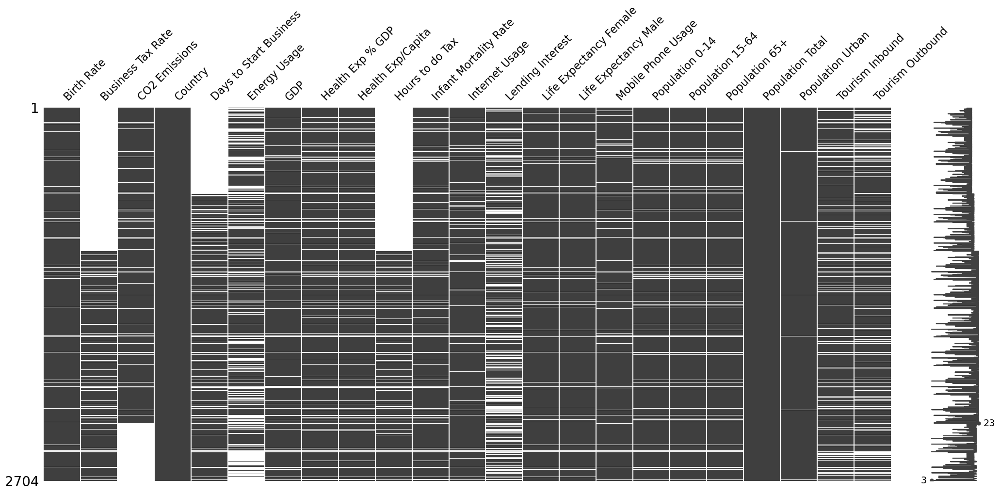

In [10]:
import missingno as mn
mn.matrix(df)
plt.show()

#### Using KNN Imputer to deal with the Null Values

Normalizing Data

In [11]:
df1 = df.copy()
df1 = df1.drop('Country',axis=1)
df1=pd.DataFrame(MinMaxScaler().fit_transform(df1),columns=df1.columns)
df1

,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,Internet Usage,Lending Interest,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.282609,NaN,0.010610,NaN,0.009895,0.003369,0.124424,0.005855,NaN,0.230216,0.0,0.019153,0.666667,0.588235,0.000000,0.586387,0.377604,0.149378,0.023470,0.563181,0.000506,0.001523
1,0.934783,NaN,0.001151,NaN,0.002746,0.000558,0.119816,0.002019,NaN,0.906475,0.0,0.207056,0.166667,0.137255,0.000000,0.937173,0.065104,0.091286,0.010296,0.263617,0.000166,0.001152
2,0.782609,NaN,0.000194,NaN,0.000724,0.000141,0.161290,0.001312,NaN,0.633094,0.0,NaN,0.375000,0.313725,0.000000,0.879581,0.111979,0.107884,0.005131,0.327887,0.000381,0.000393
3,0.434783,NaN,0.000515,NaN,0.000670,0.000352,0.179724,0.015142,NaN,0.374101,0.0,0.030242,0.270833,0.235294,0.034483,0.693717,0.294271,0.107884,0.001286,0.490196,0.001131,0.001650
4,0.847826,NaN,0.000125,NaN,NaN,0.000157,0.198157,0.001009,NaN,0.676259,0.0,NaN,0.270833,0.235294,0.000000,0.916230,0.080729,0.103734,0.008580,0.104575,0.000111,0.000235
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000010,0.903050,NaN,NaN
2700,0.130435,0.115443,NaN,0.005772,0.781766,1.000000,0.788018,0.897739,0.062983,0.028777,0.8,0.005645,0.875000,0.764706,0.344828,0.204188,0.502604,0.551867,0.232369,0.794118,1.000000,1.000000
2701,0.173913,0.101843,NaN,0.008658,NaN,0.003074,0.373272,0.131839,0.115147,0.057554,0.5,0.021573,0.854167,0.725490,0.517241,0.267016,0.429688,0.568465,0.002500,0.943355,0.011101,0.008120
2702,0.282609,0.162285,NaN,0.206349,NaN,0.023468,0.175115,0.059661,0.301391,0.079137,0.5,0.032056,0.812500,0.686275,0.344828,0.445026,0.463542,0.236515,0.022164,0.879085,0.004514,0.025296


In [12]:
null_imputer = KNNImputer()
imputed_df = pd.DataFrame(null_imputer.fit_transform(df1),columns=df1.columns)
imputed_df

,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,Internet Usage,Lending Interest,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.282609,0.074403,0.010610,0.062915,0.009895,0.003369,0.124424,0.005855,0.062674,0.230216,0.0,0.019153,0.666667,0.588235,0.000000,0.586387,0.377604,0.149378,0.023470,0.563181,0.000506,0.001523
1,0.934783,0.416017,0.001151,0.183838,0.002746,0.000558,0.119816,0.002019,0.106028,0.906475,0.0,0.207056,0.166667,0.137255,0.000000,0.937173,0.065104,0.091286,0.010296,0.263617,0.000166,0.001152
2,0.782609,0.179027,0.000194,0.050216,0.000724,0.000141,0.161290,0.001312,0.112674,0.633094,0.0,0.037621,0.375000,0.313725,0.000000,0.879581,0.111979,0.107884,0.005131,0.327887,0.000381,0.000393
3,0.434783,0.043518,0.000515,0.146609,0.000670,0.000352,0.179724,0.015142,0.077512,0.374101,0.0,0.030242,0.270833,0.235294,0.034483,0.693717,0.294271,0.107884,0.001286,0.490196,0.001131,0.001650
4,0.847826,0.180659,0.000125,0.070130,0.007332,0.000157,0.198157,0.001009,0.242504,0.676259,0.0,0.057419,0.270833,0.235294,0.000000,0.916230,0.080729,0.103734,0.008580,0.104575,0.000111,0.000235
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,0.213043,0.044545,0.004650,0.067821,0.000682,0.000148,0.282028,0.168807,0.063679,0.017266,0.2,0.027742,0.895833,0.756863,0.275862,0.332461,0.470833,0.403320,0.000010,0.903050,0.001158,0.012842
2700,0.130435,0.115443,0.674995,0.005772,0.781766,1.000000,0.788018,0.897739,0.062983,0.028777,0.8,0.005645,0.875000,0.764706,0.344828,0.204188,0.502604,0.551867,0.232369,0.794118,1.000000,1.000000
2701,0.173913,0.101843,0.000362,0.008658,0.003697,0.003074,0.373272,0.131839,0.115147,0.057554,0.5,0.021573,0.854167,0.725490,0.517241,0.267016,0.429688,0.568465,0.002500,0.943355,0.011101,0.008120
2702,0.282609,0.162285,0.000017,0.206349,0.021048,0.023468,0.175115,0.059661,0.301391,0.079137,0.5,0.032056,0.812500,0.686275,0.344828,0.445026,0.463542,0.236515,0.022164,0.879085,0.004514,0.025296


In [13]:
concated_df = pd.concat([wdm['Country'],imputed_df],axis=1)
concated_df

,Country,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,Internet Usage,Lending Interest,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,Algeria,0.282609,0.074403,0.010610,0.062915,0.009895,0.003369,0.124424,0.005855,0.062674,0.230216,0.0,0.019153,0.666667,0.588235,0.000000,0.586387,0.377604,0.149378,0.023470,0.563181,0.000506,0.001523
1,Angola,0.934783,0.416017,0.001151,0.183838,0.002746,0.000558,0.119816,0.002019,0.106028,0.906475,0.0,0.207056,0.166667,0.137255,0.000000,0.937173,0.065104,0.091286,0.010296,0.263617,0.000166,0.001152
2,Benin,0.782609,0.179027,0.000194,0.050216,0.000724,0.000141,0.161290,0.001312,0.112674,0.633094,0.0,0.037621,0.375000,0.313725,0.000000,0.879581,0.111979,0.107884,0.005131,0.327887,0.000381,0.000393
3,Botswana,0.434783,0.043518,0.000515,0.146609,0.000670,0.000352,0.179724,0.015142,0.077512,0.374101,0.0,0.030242,0.270833,0.235294,0.034483,0.693717,0.294271,0.107884,0.001286,0.490196,0.001131,0.001650
4,Burkina Faso,0.847826,0.180659,0.000125,0.070130,0.007332,0.000157,0.198157,0.001009,0.242504,0.676259,0.0,0.057419,0.270833,0.235294,0.000000,0.916230,0.080729,0.103734,0.008580,0.104575,0.000111,0.000235
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,Turks and Caicos Islands,0.213043,0.044545,0.004650,0.067821,0.000682,0.000148,0.282028,0.168807,0.063679,0.017266,0.2,0.027742,0.895833,0.756863,0.275862,0.332461,0.470833,0.403320,0.000010,0.903050,0.001158,0.012842
2700,United States,0.130435,0.115443,0.674995,0.005772,0.781766,1.000000,0.788018,0.897739,0.062983,0.028777,0.8,0.005645,0.875000,0.764706,0.344828,0.204188,0.502604,0.551867,0.232369,0.794118,1.000000,1.000000
2701,Uruguay,0.173913,0.101843,0.000362,0.008658,0.003697,0.003074,0.373272,0.131839,0.115147,0.057554,0.5,0.021573,0.854167,0.725490,0.517241,0.267016,0.429688,0.568465,0.002500,0.943355,0.011101,0.008120
2702,"Venezuela, RB",0.282609,0.162285,0.000017,0.206349,0.021048,0.023468,0.175115,0.059661,0.301391,0.079137,0.5,0.032056,0.812500,0.686275,0.344828,0.445026,0.463542,0.236515,0.022164,0.879085,0.004514,0.025296


In [14]:
concated_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Country                 2704 non-null   object 
 1   Birth Rate              2704 non-null   float64
 2   Business Tax Rate       2704 non-null   float64
 3   CO2 Emissions           2704 non-null   float64
 4   Days to Start Business  2704 non-null   float64
 5   Energy Usage            2704 non-null   float64
 6   GDP                     2704 non-null   float64
 7   Health Exp % GDP        2704 non-null   float64
 8   Health Exp/Capita       2704 non-null   float64
 9   Hours to do Tax         2704 non-null   float64
 10  Infant Mortality Rate   2704 non-null   float64
 11  Internet Usage          2704 non-null   float64
 12  Lending Interest        2704 non-null   float64
 13  Life Expectancy Female  2704 non-null   float64
 14  Life Expectancy Male    2704 non-null   

Null Values are no longer present in the dataset

In [15]:
weights = [0.1,0.2,0.2,0.3,0.3,0.4,0.5,0.66,0.73,0.77,0.83,0.87,0.9]
weighted_mean = lambda x: np.average(x,weights=weights)
final_df = concated_df.groupby('Country')[[i for i in concated_df.columns if i!='Country']].agg(weighted_mean).reset_index()
final_df.head(50)

,Country,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,Internet Usage,Lending Interest,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,Afghanistan,0.732860,0.087270,0.000487,0.011711,0.005992,0.000738,0.380191,0.003300,0.103053,0.554223,0.026183,0.031482,0.432076,0.397204,0.116099,0.967947,0.044136,0.075610,0.019904,0.171810,0.000443,0.000615
1,Albania,0.145871,0.096882,0.000571,0.026595,0.000772,0.000651,0.242304,0.020066,0.133372,0.102656,0.292308,0.025395,0.847695,0.715164,0.250612,0.328712,0.490234,0.378471,0.002140,0.454727,0.007320,0.010068
2,Algeria,0.353293,0.176565,0.013335,0.036536,0.013600,0.008957,0.149851,0.016716,0.154795,0.170704,0.097041,0.015315,0.685651,0.621360,0.241022,0.427666,0.518079,0.177073,0.026534,0.629414,0.001608,0.004199
3,American Samoa,0.223990,0.041901,0.000515,0.079653,0.002114,0.001177,0.291671,0.314744,0.072384,0.034826,0.560651,0.027967,0.858444,0.728420,0.223036,0.306239,0.519159,0.368300,0.000028,0.867154,0.016595,0.019607
4,Andorra,0.090352,0.116982,0.000051,0.019661,0.020661,0.007203,0.268345,0.274809,0.074115,0.004959,0.644822,0.014251,0.893855,0.756207,0.263620,0.283896,0.485296,0.457360,0.000044,0.878215,0.003952,0.007761
5,Angola,0.879181,0.178775,0.002823,0.125772,0.004205,0.004275,0.144780,0.013488,0.102855,0.807203,0.063166,0.065288,0.253821,0.222184,0.118751,0.941746,0.062696,0.088058,0.013567,0.330023,0.002035,0.002278
6,Antigua and Barbuda,0.234725,0.104864,0.000051,0.030764,0.000305,0.000066,0.186227,0.064117,0.068505,0.054180,0.388757,0.020852,0.800512,0.696717,0.482810,0.398564,0.478003,0.286896,0.000049,0.209842,0.001479,0.000356
7,Argentina,0.224145,0.274785,0.016309,0.042327,0.025610,0.024267,0.350939,0.067177,0.154158,0.086256,0.348817,0.028502,0.835398,0.677689,0.375638,0.358058,0.432850,0.421506,0.029357,0.897537,0.023338,0.045224
8,Armenia,0.150566,0.086401,0.000443,0.020213,0.000883,0.000496,0.173125,0.011747,0.193491,0.116513,0.185355,0.036370,0.797738,0.655761,0.234442,0.247247,0.533115,0.438496,0.002198,0.606035,0.001771,0.002995
9,Aruba,0.097119,0.085790,0.000257,0.023004,0.009306,0.000154,0.230567,0.063649,0.072875,0.081023,0.481065,0.020699,0.794656,0.692366,0.392175,0.242348,0.569877,0.387580,0.000060,0.387916,0.006052,0.002054


In [16]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 208 entries, 0 to 207
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Country                 208 non-null    object 
 1   Birth Rate              208 non-null    float64
 2   Business Tax Rate       208 non-null    float64
 3   CO2 Emissions           208 non-null    float64
 4   Days to Start Business  208 non-null    float64
 5   Energy Usage            208 non-null    float64
 6   GDP                     208 non-null    float64
 7   Health Exp % GDP        208 non-null    float64
 8   Health Exp/Capita       208 non-null    float64
 9   Hours to do Tax         208 non-null    float64
 10  Infant Mortality Rate   208 non-null    float64
 11  Internet Usage          208 non-null    float64
 12  Lending Interest        208 non-null    float64
 13  Life Expectancy Female  208 non-null    float64
 14  Life Expectancy Male    208 non-null    fl

# EDA

### Feature Correlation

In [17]:
# Calculate the correlation matrix
corr_df = final_df.select_dtypes(include='number')

corr_matrix = corr_df.corr()

# Find the highly correlated columns
highly_correlated = set()
for col in corr_matrix:
    correlated_cols = corr_matrix.index[corr_matrix[col] > 0.8]
    for c in correlated_cols:
        if c != col:
            highly_correlated.add((col, c))

# Print the result
print(f"The following columns are highly correlated:\n{highly_correlated}")

The following columns are highly correlated:
{('GDP', 'Energy Usage'), ('Life Expectancy Male', 'Life Expectancy Female'), ('Tourism Outbound', 'Tourism Inbound'), ('GDP', 'Tourism Outbound'), ('Birth Rate', 'Infant Mortality Rate'), ('Infant Mortality Rate', 'Birth Rate'), ('CO2 Emissions', 'Energy Usage'), ('GDP', 'CO2 Emissions'), ('Population 0-14', 'Infant Mortality Rate'), ('Energy Usage', 'GDP'), ('Population 0-14', 'Birth Rate'), ('Tourism Inbound', 'Tourism Outbound'), ('Energy Usage', 'CO2 Emissions'), ('Life Expectancy Female', 'Life Expectancy Male'), ('Tourism Outbound', 'GDP'), ('GDP', 'Tourism Inbound'), ('Birth Rate', 'Population 0-14'), ('Tourism Inbound', 'GDP'), ('Infant Mortality Rate', 'Population 0-14'), ('CO2 Emissions', 'GDP')}


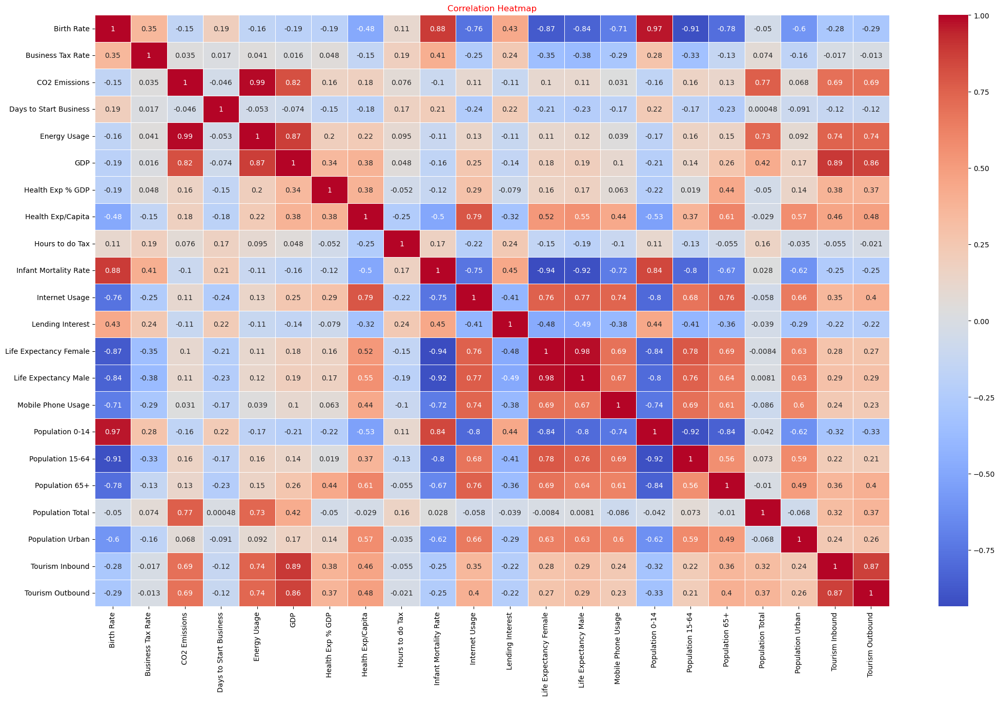

In [18]:
df_heatmap = final_df.select_dtypes(include='number')

fig=plt.figure(figsize=(25,15))
sns.heatmap(df_heatmap.corr(),linewidths=0.5,annot=True,cmap='coolwarm')
plt.title('Correlation Heatmap',fontdict={'color':'red'})
fig.savefig('Corr.jpg',dpi=500)
plt.show()

### Visualizing the data

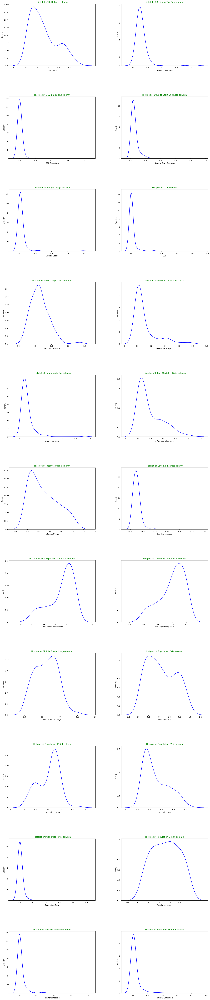

In [19]:
ddf = final_df.copy()
fig, axs = plt.subplots(11,2,sharex=False,sharey=False,figsize=(20,100))
plt.subplots_adjust(wspace=0.3, hspace=0.5)
counter = 0
for i in ddf.columns:
    if i != 'Country':
        x=counter//2
        y=counter%2
        sns.distplot(ddf[i],kde=True,hist=False,color='b',ax=axs[x,y])
        axs[x,y].set_title('Histplot of {} column'.format(i),fontdict={'color':'green'})
        counter+=1
#fig.savefig('dist.jpg',dpi=500)
plt.show()


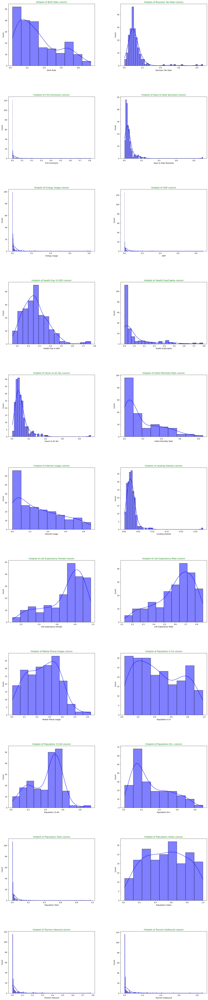

In [20]:
gdf = final_df.copy()
fig, axs = plt.subplots(11,2,sharex=False,sharey=False,figsize=(20,100))
plt.subplots_adjust(wspace=0.3, hspace=0.5)
counter = 0
for i in gdf.columns:
    if i != 'Country':
        x=counter//2
        y=counter%2
        sns.histplot(gdf[i],kde=True,color='b',ax=axs[x,y])
        axs[x,y].set_title('Histplot of {} column'.format(i),fontdict={'color':'green'})
        counter+=1
#fig.savefig('hist.jpg',dpi=500)
plt.show()


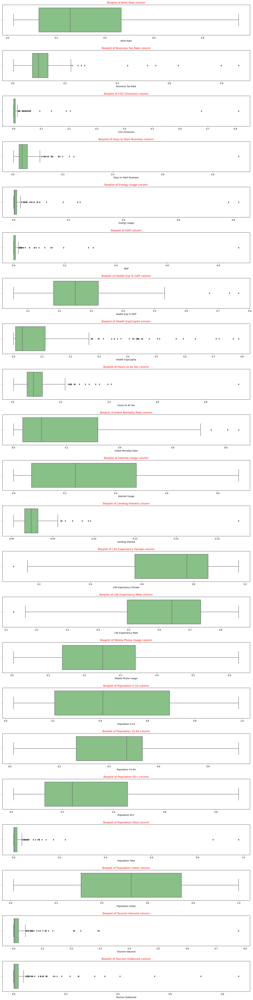

In [21]:
fig, axs = plt.subplots(22,1,sharex=False,sharey=False,figsize=(20,80))
plt.subplots_adjust(wspace=0.3, hspace=0.5)
counter = 0
for i in final_df.columns:
    if i != 'Country':
        sns.boxplot(x=i,data = final_df,palette = 'Accent',ax = axs[counter])
        axs[counter].set_title('Boxplot of {} column'.format(i),fontdict={'color':'red'})
        counter+=1
#fig.savefig('box.jpg',dpi=700)
plt.show()


### Top 15 Features

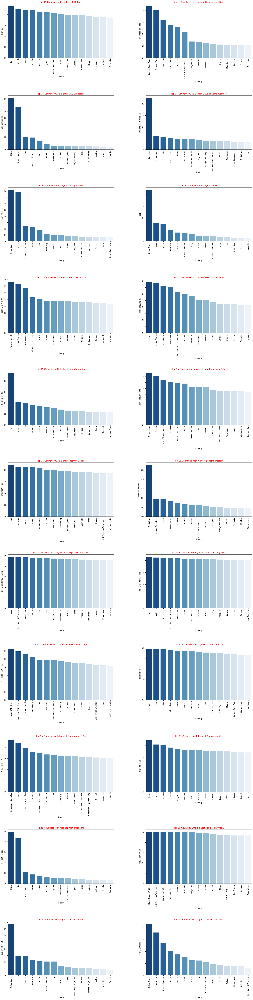

In [22]:
df4 = final_df.copy()
fig, axs = plt.subplots(11,2,sharex=False,sharey=False,figsize=(25,100))
plt.subplots_adjust(wspace=0.3, hspace=0.7)
counter = 0
for i in df4.columns:
    if i != 'Country':
        x=counter//2
        y=counter%2       
        df5 = df4.sort_values(by =i,ascending=False)
        df6 = df5.head(15)
        sns.barplot(x=df6['Country'],y=df6[i],palette='Blues_r',data=df6,ax=axs[x,y])
        axs[x,y].set_title('Top 15 Countries with highest {}'.format(i),fontdict={'color':'red'})
        for tick in axs[x,y].get_xticklabels():
                        tick.set_rotation(90)
        counter+=1
#fig.savefig('Top15.jpg',dpi=500)
plt.show()


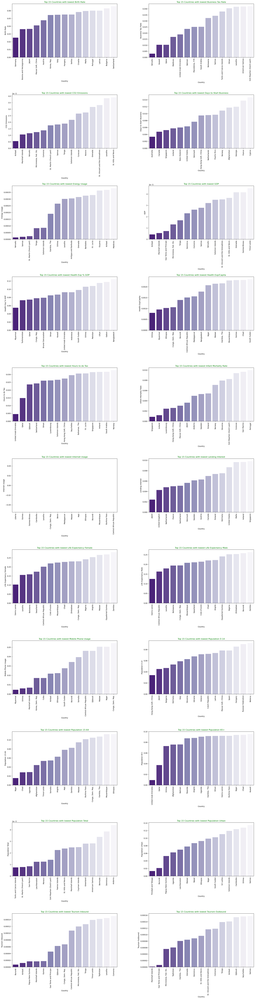

In [23]:
df4 = final_df.copy()
fig, axs = plt.subplots(11,2,sharex=False,sharey=False,figsize=(25,100))
plt.subplots_adjust(wspace=0.3, hspace=0.7)
counter = 0
for i in df4.columns:
    if i != 'Country':
        x=counter//2
        y=counter%2       
        df5 = df4.sort_values(by =i)
        df6 = df5.head(15)
        sns.barplot(x=df6['Country'],y=df6[i],palette='Purples_r',data=df6,ax=axs[x,y])
        axs[x,y].set_title('Top 15 Countries with lowest {}'.format(i),fontdict={'color':'green'})
        for tick in axs[x,y].get_xticklabels():
                        tick.set_rotation(90)
        counter+=1
#fig.savefig('Least15.jpg',dpi=500)
plt.show()


### GDP Distribution

Text(0.5, 1.0, 'Top 10 Countries based on GDP')

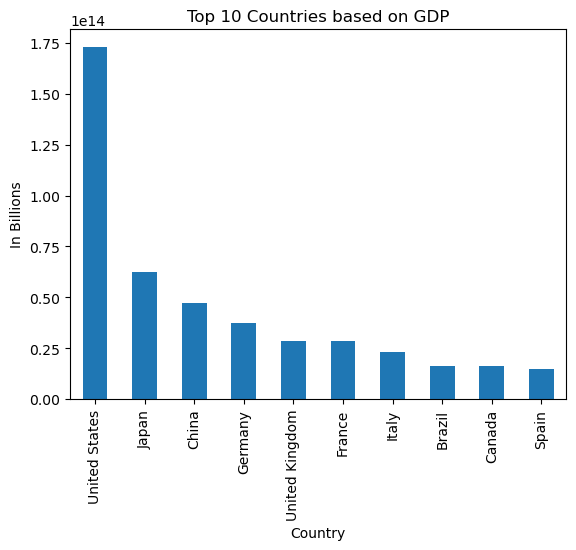

In [24]:
country_pop=df.groupby('Country')['GDP'].sum()

top_10_GDP = country_pop.nlargest(10)

df_pop_GDP=pd.Series(top_10_GDP)
df_pop_GDP.plot(kind='bar')
plt.xlabel('Country')
plt.ylabel('In Billions')
plt.title('Top 10 Countries based on GDP')

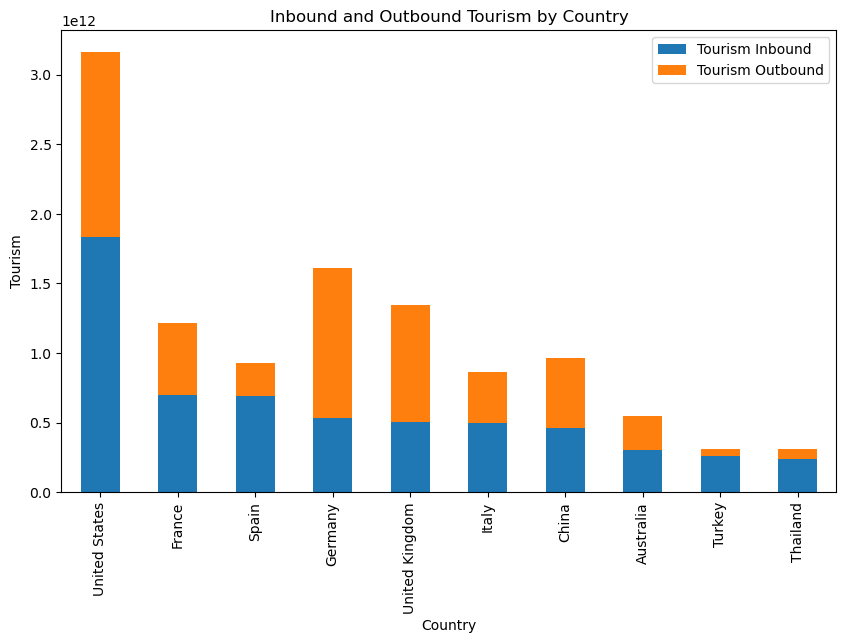

In [25]:
tourism_df = df.groupby('Country')[['Tourism Inbound', 'Tourism Outbound']].sum()
top_10_tourism_df=tourism_df.nlargest(10,columns=['Tourism Inbound'])
# Create a stacked bar chart
ax = top_10_tourism_df.sort_values(by=['Tourism Inbound'],ascending=False).plot(kind='bar', stacked=True, figsize=(10,6))

# Set the chart title and axis labels
ax.set_title('Inbound and Outbound Tourism by Country')
ax.set_xlabel('Country')
ax.set_ylabel('Tourism')
            

# Show the chart
plt.show()

### Population Distribution

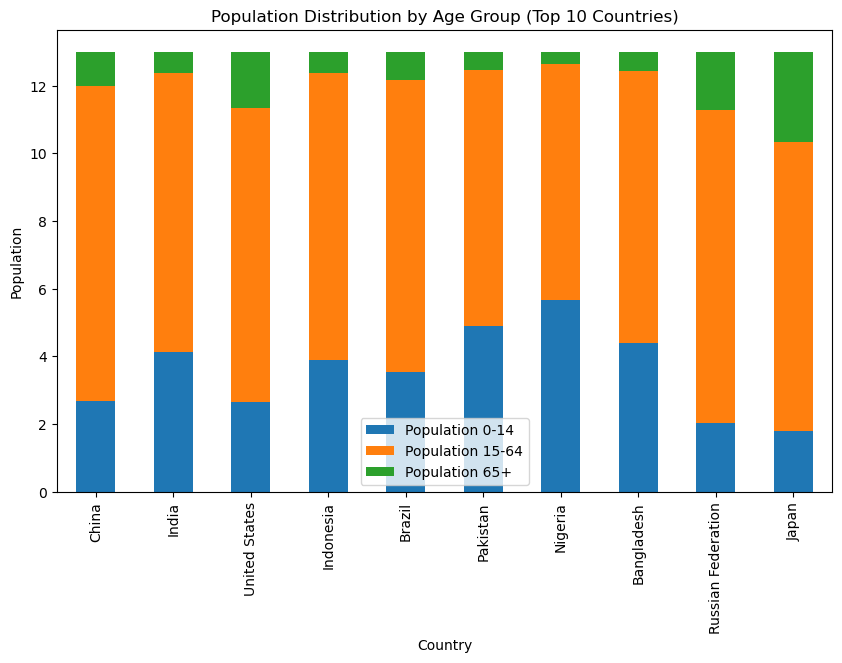

In [26]:
# Get the top 10 countries by total population
top_10 = df.groupby('Country')['Population Total'].sum().nlargest(10).index

# Group the data by country and sum the population by age group
grouped = df.groupby('Country')[['Population 0-14', 'Population 15-64', 'Population 65+']].sum()

# Filter the data to only include the top 10 countries
grouped = grouped.loc[top_10]

# Create a stacked bar chart for each country
fig, ax = plt.subplots(figsize=(10, 6))

grouped.plot(kind='bar', stacked=True, ax=ax)

# Set the chart title and axis labels
ax.set_title('Population Distribution by Age Group (Top 10 Countries)')
ax.set_xlabel('Country')
ax.set_ylabel('Population')

# Show the chart
plt.show()

In [27]:
top_10_countries = df.sort_values("GDP", ascending=False).head(10)
top_10_countries

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,Internet Usage,Lending Interest,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
2700,0.013,46.4,NaN,United States,5.0,2132446.0,1.624460e+13,0.179,8895.0,175.0,0.006,0.8,0.033,81.0,76.0,1.0,0.196,0.667,0.136,313873685,0.811,2.000920e+11,1.265730e+11
2492,0.013,46.5,NaN,United States,5.0,2191193.0,1.553380e+13,0.177,8467.0,187.0,0.006,0.7,0.033,81.0,76.0,0.9,0.197,0.669,0.133,311582564,0.809,1.845360e+11,1.173270e+11
2284,0.013,46.5,5433057.0,United States,5.0,2215504.0,1.495830e+13,0.177,8254.0,187.0,0.006,0.7,0.033,81.0,76.0,0.9,0.198,0.671,0.131,309326295,0.808,1.646060e+11,1.103130e+11
1868,0.014,46.4,5656839.0,United States,5.0,2277034.0,1.472030e+13,0.165,7769.0,187.0,0.007,0.7,0.051,81.0,76.0,0.9,0.201,0.673,0.127,304093966,0.804,1.705240e+11,1.192170e+11
1660,0.014,46.1,5828697.0,United States,6.0,2337014.0,1.448030e+13,0.161,7486.0,325.0,0.007,0.8,0.081,80.0,75.0,0.8,0.202,0.673,0.125,301231207,0.803,1.488460e+11,1.111020e+11
2076,0.014,46.1,5311840.0,United States,5.0,2164458.0,1.441790e+13,0.177,8009.0,187.0,0.006,0.7,0.033,81.0,76.0,0.9,0.200,0.672,0.128,306771529,0.806,1.495100e+11,1.062850e+11
1452,0.014,47.4,5737616.0,United States,6.0,2296686.0,1.385790e+13,0.159,7110.0,325.0,0.007,0.7,0.080,80.0,75.0,0.8,0.204,0.672,0.124,298379912,0.801,1.333930e+11,1.054760e+11
1244,0.014,45.8,5826394.0,United States,6.0,2318861.0,1.309540e+13,0.158,6732.0,325.0,0.007,0.7,0.062,80.0,75.0,0.7,0.205,0.671,0.123,295516599,0.799,1.272370e+11,1.002500e+11
1036,0.014,NaN,5790765.0,United States,6.0,2307819.0,1.227700e+13,0.157,6355.0,NaN,0.007,0.6,0.043,80.0,75.0,0.6,0.207,0.670,0.123,292805298,0.798,1.156890e+11,9.476400e+10
828,0.014,NaN,5681664.0,United States,6.0,2261151.0,1.151220e+13,0.156,5993.0,NaN,0.007,0.6,0.041,80.0,75.0,0.5,0.209,0.669,0.123,290107933,0.796,1.015350e+11,8.209100e+10


In [28]:
pop_df=df.groupby('Country').sum()[['Population Total','Population 0-14','Population 15-64','Population 65+','GDP']].nlargest(10,'Population Total')
pop_df

,Population Total,Population 0-14,Population 15-64,Population 65+,GDP
Country,,,,,
China,17020440000,2.684,9.303,1.013,4.700757e+13
India,14840677489,4.134,8.244,0.622,1.389328e+13
United States,3878445547,2.654,8.702,1.643,1.729929e+14
Indonesia,2961622996,3.901,8.464,0.636,5.577060e+12
Brazil,2436961595,3.527,8.651,0.822,1.639890e+13
Pakistan,2096337537,4.908,7.552,0.541,1.752628e+12
Nigeria,1876067490,5.683,6.961,0.355,2.350603e+12
Bangladesh,1875157358,4.392,8.041,0.569,9.379630e+11
Russian Federation,1866571740,2.040,9.237,1.723,1.331709e+13


In [29]:
pop_0_14_count=[p*t for p,t in zip(pop_df['Population 0-14'],pop_df['Population Total'])]
pop_15_65_count=[p*t for p,t in zip(pop_df['Population 15-64'],pop_df['Population Total'])]
pop_65plus_count=[p*t for p,t in zip(pop_df['Population 65+'],pop_df['Population Total'])]

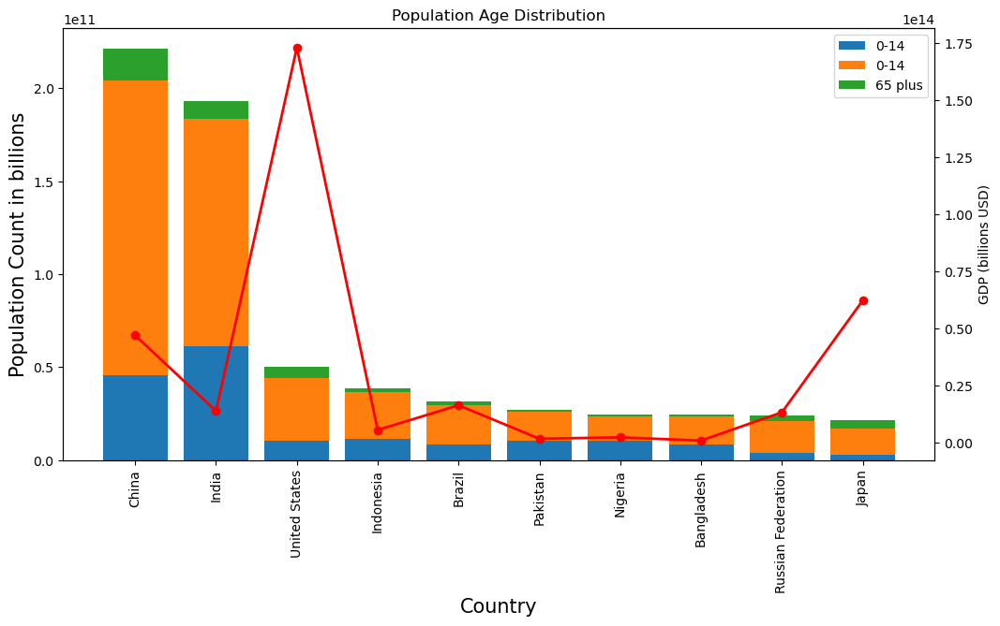

<Figure size 640x480 with 0 Axes>

In [30]:
fig, ax = plt.subplots(figsize=(12, 6))
ax.bar(pop_df.index,pop_0_14_count,label='0-14')
ax.bar(pop_df.index,pop_15_65_count,bottom=pop_0_14_count,label='0-14')
ax.bar(pop_df.index,pop_65plus_count,bottom=[sum(x) for x in zip(pop_0_14_count,pop_15_65_count)],label='65 plus')
ax.set_xlabel('Country',fontsize=15)
plt.xticks(rotation=90)
# create a second y-axis for GDP data
ax2 = ax.twinx()
ax2.plot(pop_df.index, pop_df['GDP'], color='red', marker='o', linewidth=2, label='GDP')
ax2.set_ylabel('GDP (billions USD)')

ax.set_ylabel('Population Count in billions',fontsize=15)
ax.set_title('Population Age Distribution')
ax.legend()
plt.show()
plt.tight_layout()

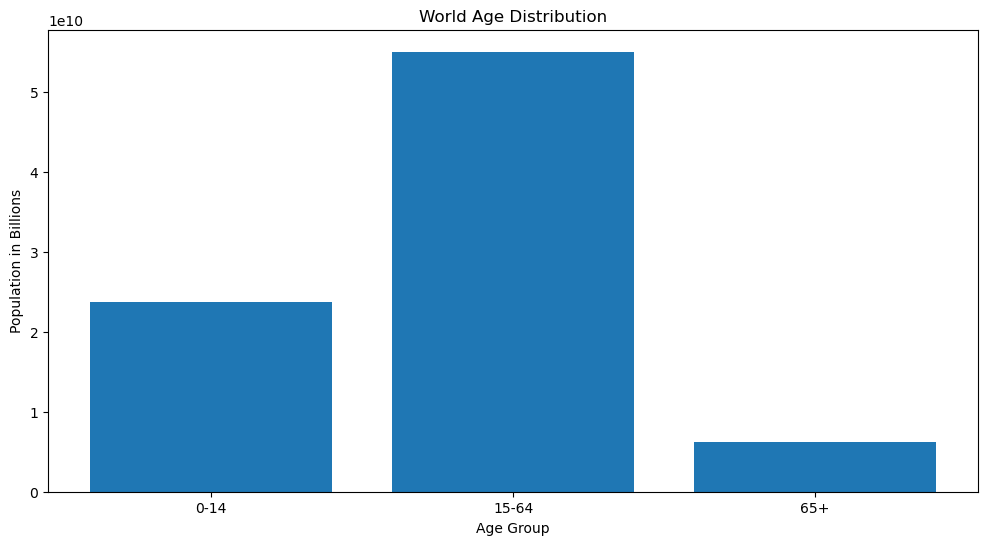

In [31]:
# calculate total population in each age group
pop_0_14_total = (df['Population Total'] * df['Population 0-14']).sum()
pop_15_64_total = (df['Population Total'] * df['Population 15-64']).sum()
pop_65_plus_total = (df['Population Total'] * df['Population 65+']).sum()

# create a bar chart of age distribution
fig, ax = plt.subplots(figsize=(12,6))
ax.bar(['0-14', '15-64', '65+'], [pop_0_14_total, pop_15_64_total, pop_65_plus_total])
ax.set_xlabel('Age Group')
ax.set_ylabel('Population in Billions')
ax.set_title('World Age Distribution')
plt.show()


### Energy Use

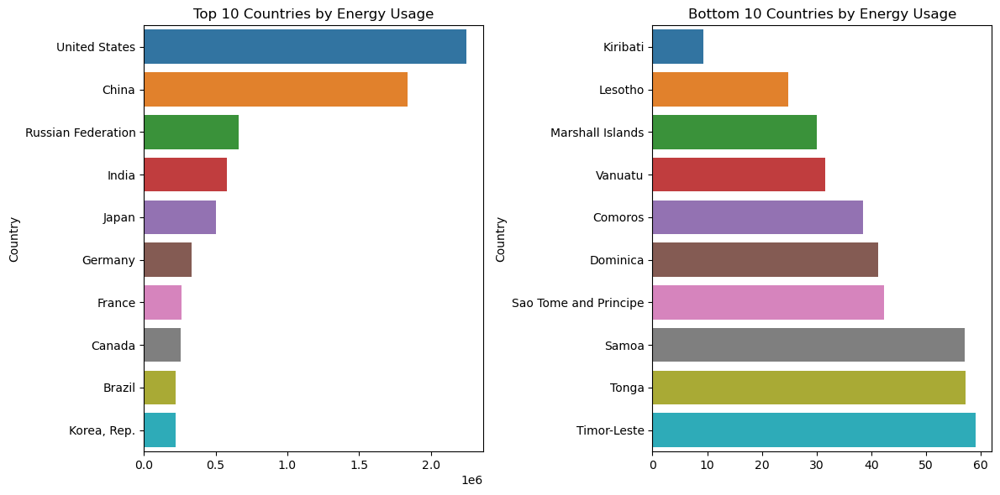

In [32]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12,6))

gp = df.groupby('Country')['Energy Usage'].mean().nlargest(10)
gp1 = df.groupby('Country')['Energy Usage'].mean().nsmallest(10)

sns.barplot(x=gp.values, y=gp.index, ax=axes[0])
sns.barplot(x=gp1.values, y=gp1.index, ax=axes[1])

axes[0].set_title('Top 10 Countries by Energy Usage')
axes[1].set_title('Bottom 10 Countries by Energy Usage')

plt.tight_layout()

### Tourism 

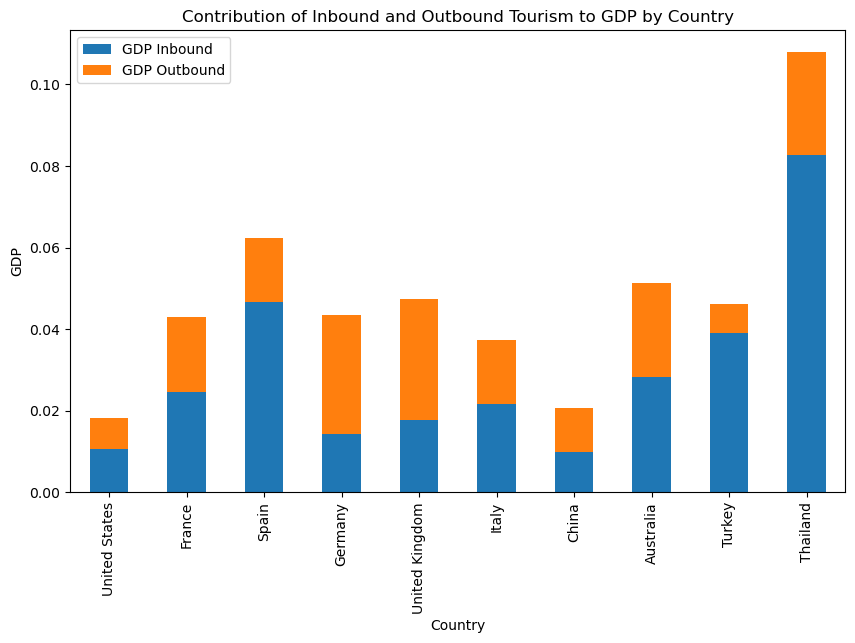

In [33]:
import matplotlib.pyplot as plt
import pandas as pd

# Get the top 10 countries by inbound tourism
tourism_df = df.groupby('Country')[['Tourism Inbound', 'Tourism Outbound', 'GDP']].sum()
top_10_tourism_df = tourism_df.nlargest(10, columns=['Tourism Inbound'])

# Calculate the contribution of inbound and outbound tourism to GDP
top_10_tourism_df['GDP Inbound'] = top_10_tourism_df['Tourism Inbound'] / top_10_tourism_df['GDP']
top_10_tourism_df['GDP Outbound'] = top_10_tourism_df['Tourism Outbound'] / top_10_tourism_df['GDP']

# Create a stacked bar chart showing the contribution of inbound and outbound tourism to GDP
ax = top_10_tourism_df[['GDP Inbound', 'GDP Outbound']].plot(kind='bar', stacked=True, figsize=(10,6))

# Set the chart title and axis labels
ax.set_title('Contribution of Inbound and Outbound Tourism to GDP by Country')
ax.set_xlabel('Country')
ax.set_ylabel('GDP')

# Show the chart
plt.show()


### Pollution

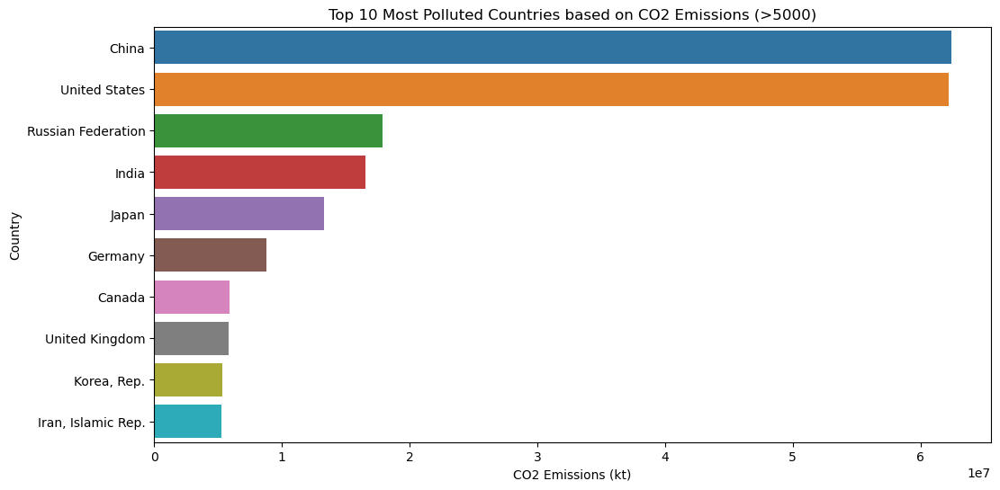

In [34]:
# Subset the DataFrame to include only countries with CO2 emissions above 5000
polluted_df = df[df['CO2 Emissions'] > 5000]

# Group the DataFrame by country and sum the CO2 emissions
polluted_df = polluted_df.groupby('Country')[['CO2 Emissions','Energy Usage']].sum().nlargest(10,'CO2 Emissions')

# Create a horizontal bar chart
fig, ax = plt.subplots(figsize=(12, 6))
sns.barplot(x='CO2 Emissions', y=polluted_df.index, data=polluted_df)

# Set the chart title and axis labels
ax.set_title('Top 10 Most Polluted Countries based on CO2 Emissions (>5000)')
ax.set_xlabel('CO2 Emissions (kt)')
ax.set_ylabel('Country')


# Show the chart
plt.show()


## Dimensionality Reduction - PCA

In [35]:
!pip install bioinfokit

In [36]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from bioinfokit.visuz import cluster

In [37]:
pca = PCA()
pca_df = pd.DataFrame(pca.fit_transform(final_df.iloc[:,1:]),columns=['PCA1','PCA2','PCA3','PCA4','PCA5','PCA6','PCA7','PCA8','PCA9','PCA10','PCA11','PCA12','PCA13','PCA14','PCA15','PCA16','PCA17','PCA18','PCA19','PCA20','PCA21','PCA22'])

In [38]:
pca_df.head(10)

,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7,PCA8,PCA9,PCA10,PCA11,PCA12,PCA13,PCA14,PCA15,PCA16,PCA17,PCA18,PCA19,PCA20,PCA21,PCA22
0,1.005212,0.141537,0.100866,-0.115094,-0.131577,-0.079093,-0.052618,-0.057070,-0.055618,0.041083,0.101061,-0.012126,-0.019538,0.085894,0.022136,-0.038076,-0.014758,0.018435,-0.006186,-0.004492,0.001046,0.000095
1,-0.217874,-0.250431,0.031709,-0.012559,-0.014370,-0.076223,0.020050,0.015336,0.007934,0.014422,-0.007191,-0.029725,-0.035816,0.017567,0.030546,-0.036403,-0.005991,-0.005366,0.002855,-0.003569,-0.001413,-0.000075
2,0.067427,-0.116256,-0.196313,0.171695,0.055805,-0.008603,0.024531,0.064943,-0.006311,-0.025801,-0.045717,-0.055133,0.041542,0.028716,-0.038763,0.039736,-0.002317,-0.034164,-0.008087,0.012528,-0.001891,-0.000126
3,-0.513874,0.176063,-0.167303,-0.049556,-0.072729,0.018557,-0.068837,0.050104,0.094733,0.048501,0.013774,0.012061,-0.028423,-0.039910,-0.035997,0.016513,0.005611,0.021450,0.005399,-0.006630,-0.002478,-0.000047
4,-0.643922,0.148853,-0.129608,-0.081245,-0.034744,-0.005212,0.025852,0.060854,0.069250,0.017037,0.051873,-0.002980,-0.040667,-0.079377,0.047918,-0.070248,-0.001284,0.007353,-0.010323,-0.001124,0.010571,0.000050
5,1.166577,0.335445,-0.012369,-0.071422,0.114115,0.157205,0.057184,-0.071687,0.031620,-0.048114,0.017505,0.033706,-0.135740,0.141966,-0.043503,-0.044895,-0.011353,0.029379,0.023532,-0.004475,-0.003174,-0.000058
6,-0.122425,-0.308237,0.120358,-0.134596,-0.171288,0.122386,0.125808,-0.070092,-0.124294,-0.000217,-0.024834,0.029202,0.101177,0.033551,0.022226,-0.020465,-0.016276,-0.015341,0.004470,0.008519,0.000704,0.000043
7,-0.356614,0.125032,-0.168347,0.085523,0.132425,-0.180731,0.108728,0.025289,-0.112115,-0.007834,0.030562,0.045179,0.034214,-0.011433,0.031361,-0.017166,-0.009187,0.013568,0.001406,0.008578,0.000561,0.000570
8,-0.243262,-0.231114,-0.058441,0.077071,0.153268,-0.091957,0.002019,-0.017483,0.080599,-0.041858,-0.028668,-0.085150,-0.023361,0.020029,-0.012400,-0.010251,-0.004462,-0.008688,0.013211,-0.000313,-0.001737,0.000186
9,-0.356369,-0.262694,0.105731,-0.100873,-0.005911,0.129504,0.036827,-0.015983,-0.070421,0.026072,0.011014,0.008809,0.000530,0.003795,0.033159,-0.044981,-0.003998,-0.017222,0.001523,0.003063,0.005901,0.000312


In [39]:
var = pca.explained_variance_ratio_
variance = np.cumsum(np.round(var,decimals = 4)*100)
variance

array([66.41, 73.89, 80.43, 85.  , 88.64, 91.12, 92.77, 94.16, 95.35,
       96.38, 97.26, 98.01, 98.62, 99.14, 99.42, 99.67, 99.79, 99.88,
       99.94, 99.99, 99.99, 99.99])

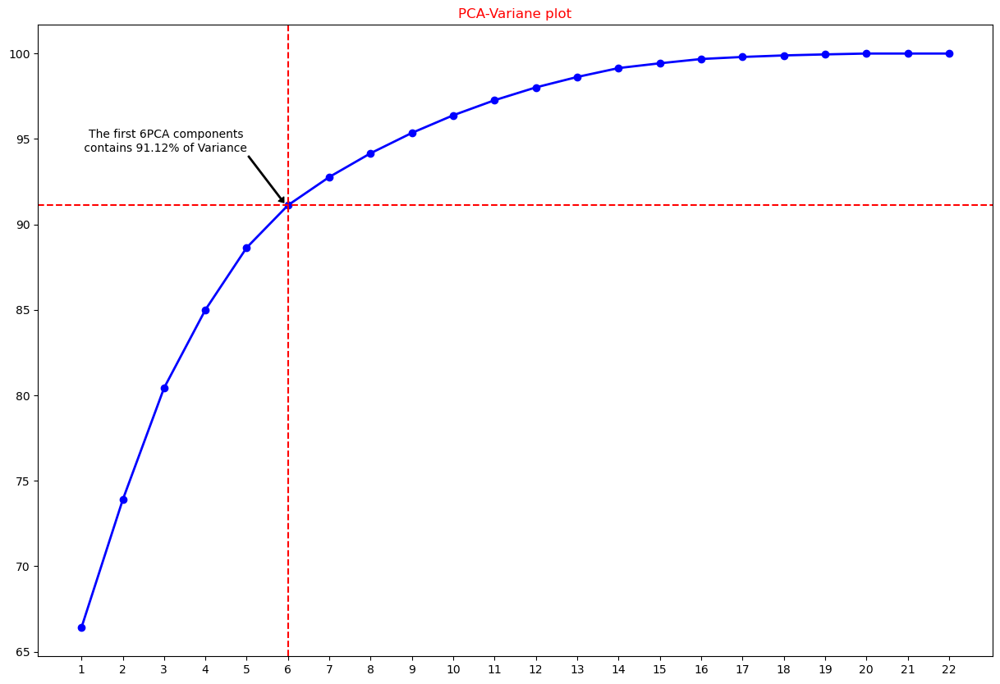

In [40]:
fig = plt.figure(figsize=(15,10))
plt.plot(np.arange(pca.n_components_) + 1,variance,marker='o', linewidth=2, color='blue')
plt.xticks(np.arange(pca.n_components_)+1)
plt.axvline(x=6,animated=True,color='red',linestyle='--')
plt.axhline(y=91.12,animated=True,color='red',linestyle='--')
x=6
y=91.12
plt.annotate("The first 6PCA components \n contains 91.12% of Variance",
             xy=(x-0.1, y+0.15), xytext=(x-1,y+3), arrowprops=dict(facecolor='black', headwidth=6, width=1, headlength=4), horizontalalignment='right', verticalalignment='bottom')
fig.savefig('PCA.jpg',dpi=500)
plt.title('PCA-Variane plot',fontdict={'color':'red'})
plt.show()

In [41]:
data_tsne_2 = TSNE(n_components=2,random_state=21).fit_transform(final_df.iloc[:,1:])

In [42]:
data_tsne_2 = pd.DataFrame(data_tsne_2)

In [43]:
data_tsne_3 = TSNE(n_components=3,random_state=21).fit_transform(final_df.iloc[:,1:])

In [44]:
data_tsne_3 = pd.DataFrame(data_tsne_3)

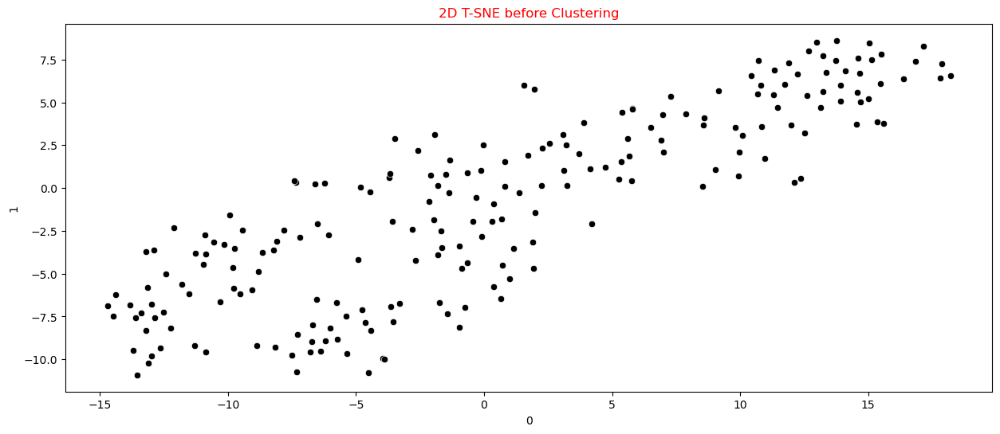

In [45]:
fig=plt.figure(figsize=(15,6))
sns.scatterplot(x=data_tsne_2.iloc[:,0],y=data_tsne_2.iloc[:,1],color='black')
plt.title('2D T-SNE before Clustering',fontdict={'color':'red'})
fig.savefig('TSNE-2D.jpg')
plt.show()

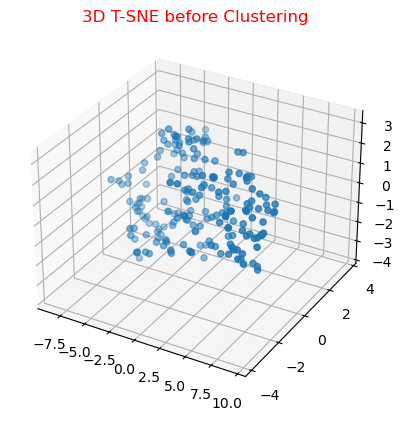

In [46]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(data_tsne_3.iloc[:,0], data_tsne_3.iloc[:,1], data_tsne_3.iloc[:,2])
plt.title('3D T-SNE before Clustering',fontdict={'color':'red'})
plt.show()
fig.savefig('TSNE-3D.jpg',dpi=400)

# Model Building

## Agglomerative & Heirarchical Clustering

### Agglomerative

In [47]:
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

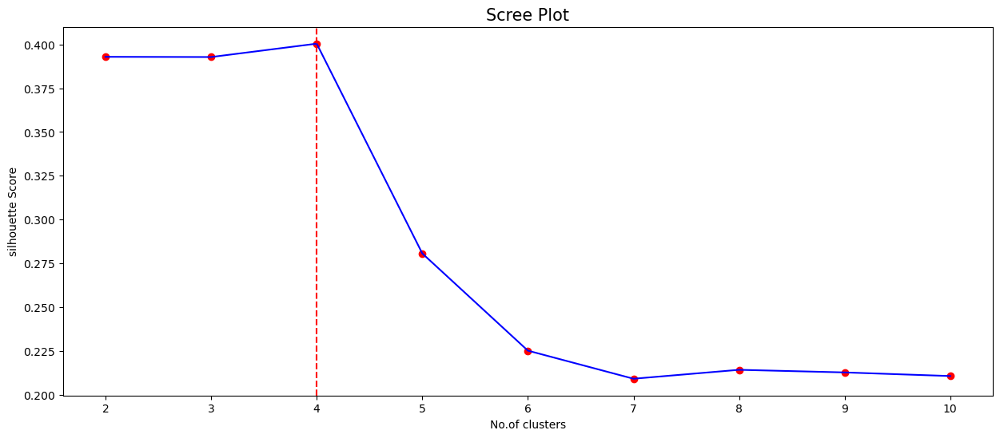

The maximum silhouette score obtained for n_clusters = 4
 and the Silhouette_score is : 0.40041943185526235


In [48]:
nc=range(2,11)
sc_score=[]    
for i in range(2,11):
    clusterer = AgglomerativeClustering(n_clusters= i , affinity='euclidean', linkage='complete')
    y = clusterer.fit_predict(final_df.iloc[:,1:])

    silhouette_avg = silhouette_score(final_df.iloc[:,1:], y)
    sc_score.append(silhouette_avg)


plt.figure(figsize=(15,6))
plt.title('Scree Plot',fontsize=15)
plt.xlabel('No.of clusters',fontsize= 10)
plt.ylabel('silhouette Score', fontsize= 10)
plt.plot(nc,sc_score,color="blue")
plt.axvline(x=nc[np.argmax(sc_score)],linestyle='--',c='red')
plt.scatter(nc,sc_score,color="red")
plt.show()
print("The maximum silhouette score obtained for n_clusters = {}\n and the Silhouette_score is : {}".format(nc[np.argmax(sc_score)],np.max(sc_score)))

### Heirarchical

In [49]:
h_clusterer = AgglomerativeClustering(n_clusters= 4 , affinity='euclidean', linkage='complete')
h_labels = h_clusterer.fit_predict(final_df.iloc[:,1:])

silhouette_avg = silhouette_score(final_df.iloc[:,1:], h_labels)
print('Silhoutte Scored is {}'.format(silhouette_avg))

Silhoutte Scored is 0.40041943185526235


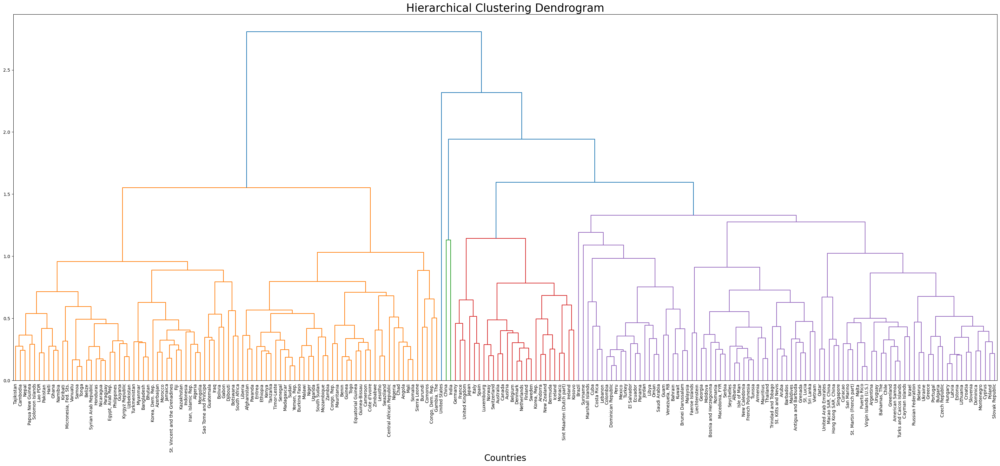

In [50]:
fig = plt.figure(figsize=(40,15))
plt.title('Hierarchical Clustering Dendrogram',fontsize=25)
plt.xlabel('Countries',fontsize= 20)
dendrogram = sch.dendrogram(sch.linkage(final_df.iloc[:,1:], method='complete'),orientation='top',labels=final_df.set_index('Country').index, leaf_font_size=10, color_threshold=sch.linkage(final_df.iloc[:,1:], method='complete')[-4, 2])
plt.show()
fig.savefig('Dendrogram.jpg',dpi=400)

## K-Means Clustering 

In [51]:
final_df_encoded = final_df.drop(columns=['Country'])

final_df_encoded

,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,Internet Usage,Lending Interest,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.732860,0.087270,0.000487,0.011711,0.005992,0.000738,0.380191,0.003300,0.103053,0.554223,0.026183,0.031482,0.432076,0.397204,0.116099,0.967947,0.044136,0.075610,0.019904,0.171810,0.000443,0.000615
1,0.145871,0.096882,0.000571,0.026595,0.000772,0.000651,0.242304,0.020066,0.133372,0.102656,0.292308,0.025395,0.847695,0.715164,0.250612,0.328712,0.490234,0.378471,0.002140,0.454727,0.007320,0.010068
2,0.353293,0.176565,0.013335,0.036536,0.013600,0.008957,0.149851,0.016716,0.154795,0.170704,0.097041,0.015315,0.685651,0.621360,0.241022,0.427666,0.518079,0.177073,0.026534,0.629414,0.001608,0.004199
3,0.223990,0.041901,0.000515,0.079653,0.002114,0.001177,0.291671,0.314744,0.072384,0.034826,0.560651,0.027967,0.858444,0.728420,0.223036,0.306239,0.519159,0.368300,0.000028,0.867154,0.016595,0.019607
4,0.090352,0.116982,0.000051,0.019661,0.020661,0.007203,0.268345,0.274809,0.074115,0.004959,0.644822,0.014251,0.893855,0.756207,0.263620,0.283896,0.485296,0.457360,0.000044,0.878215,0.003952,0.007761
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203,0.209030,0.089237,0.012901,0.058706,0.017648,0.006019,0.257246,0.006458,0.344453,0.143629,0.242012,0.024353,0.850468,0.655383,0.288257,0.348675,0.545253,0.259342,0.062963,0.228064,0.019493,0.009718
204,0.115963,0.137745,0.000208,0.016422,0.012143,0.002810,0.269679,0.164183,0.072096,0.021834,0.320266,0.015926,0.898515,0.761805,0.254999,0.255460,0.482399,0.506697,0.000065,0.936919,0.005994,0.006692
205,0.577631,0.146811,0.002413,0.050622,0.002794,0.001545,0.194169,0.005615,0.093867,0.348027,0.083728,0.040321,0.508845,0.466527,0.110641,0.829123,0.167252,0.100082,0.016046,0.243925,0.003310,0.002134
206,0.793736,0.065660,0.000278,0.041010,0.002919,0.000814,0.257444,0.006422,0.069800,0.480599,0.060651,0.045058,0.281466,0.262966,0.109978,0.915103,0.082312,0.098499,0.009270,0.323318,0.000609,0.000898


In [52]:
!pip install yellowbrick

In [53]:
pip install -U kaleido

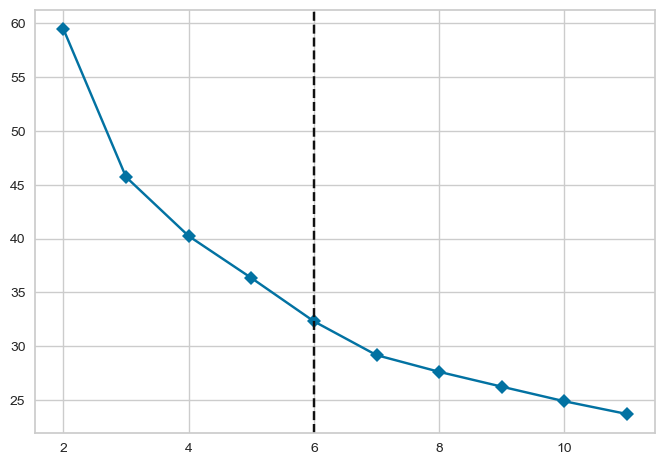

In [54]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
import plotly.graph_objects as go


model = KMeans(init='k-means++', random_state=42)

# Create the Elbow plot
visualizer = KElbowVisualizer(model, k=(2, 12), metric='distortion', timings=False)

# Fit the visualizer to the data
visualizer.fit(final_df.iloc[:, 1:])

# Get the data for the Elbow plot
k_values = visualizer.k_values_
k_scores = visualizer.k_scores_

# Create the Elbow plot using Plotly
fig = go.Figure()

fig.add_trace(go.Scatter(x=k_values, y=k_scores, mode='markers+lines', marker=dict(size=8, color='red'), line=dict(width=2)))

fig.update_layout(
    title='Elbow Plot for KMeans Clustering',
    xaxis_title='Number of Clusters (K)',
    yaxis_title='Distortion',
    showlegend=False,
    hovermode='closest',
)

# Save the figure as an image file (Elbow.jpg)
fig.write_image('Elbow.jpg')

# Show the plot
fig.show()

In [55]:
from sklearn.metrics import davies_bouldin_score
k_mean=KMeans(n_clusters=4, init='k-means++',random_state=42)
k_mean.fit(final_df_encoded)
k_labels = k_mean.fit_predict(final_df_encoded)
print('silhouette_score :',silhouette_score(final_df_encoded, k_labels)," DB index:",davies_bouldin_score(final_df_encoded, k_labels))
print(" labels:" , set(k_labels))

silhouette_score : 0.24401492522375332  DB index: 1.3376399280350793
 labels: {0, 1, 2, 3}


In [56]:
final_df_encoded

,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,Internet Usage,Lending Interest,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.732860,0.087270,0.000487,0.011711,0.005992,0.000738,0.380191,0.003300,0.103053,0.554223,0.026183,0.031482,0.432076,0.397204,0.116099,0.967947,0.044136,0.075610,0.019904,0.171810,0.000443,0.000615
1,0.145871,0.096882,0.000571,0.026595,0.000772,0.000651,0.242304,0.020066,0.133372,0.102656,0.292308,0.025395,0.847695,0.715164,0.250612,0.328712,0.490234,0.378471,0.002140,0.454727,0.007320,0.010068
2,0.353293,0.176565,0.013335,0.036536,0.013600,0.008957,0.149851,0.016716,0.154795,0.170704,0.097041,0.015315,0.685651,0.621360,0.241022,0.427666,0.518079,0.177073,0.026534,0.629414,0.001608,0.004199
3,0.223990,0.041901,0.000515,0.079653,0.002114,0.001177,0.291671,0.314744,0.072384,0.034826,0.560651,0.027967,0.858444,0.728420,0.223036,0.306239,0.519159,0.368300,0.000028,0.867154,0.016595,0.019607
4,0.090352,0.116982,0.000051,0.019661,0.020661,0.007203,0.268345,0.274809,0.074115,0.004959,0.644822,0.014251,0.893855,0.756207,0.263620,0.283896,0.485296,0.457360,0.000044,0.878215,0.003952,0.007761
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203,0.209030,0.089237,0.012901,0.058706,0.017648,0.006019,0.257246,0.006458,0.344453,0.143629,0.242012,0.024353,0.850468,0.655383,0.288257,0.348675,0.545253,0.259342,0.062963,0.228064,0.019493,0.009718
204,0.115963,0.137745,0.000208,0.016422,0.012143,0.002810,0.269679,0.164183,0.072096,0.021834,0.320266,0.015926,0.898515,0.761805,0.254999,0.255460,0.482399,0.506697,0.000065,0.936919,0.005994,0.006692
205,0.577631,0.146811,0.002413,0.050622,0.002794,0.001545,0.194169,0.005615,0.093867,0.348027,0.083728,0.040321,0.508845,0.466527,0.110641,0.829123,0.167252,0.100082,0.016046,0.243925,0.003310,0.002134
206,0.793736,0.065660,0.000278,0.041010,0.002919,0.000814,0.257444,0.006422,0.069800,0.480599,0.060651,0.045058,0.281466,0.262966,0.109978,0.915103,0.082312,0.098499,0.009270,0.323318,0.000609,0.000898


silhouette_score : 0.24401492522375332  DB index: 1.3376399280350793
 labels: {0, 1, 2, 3}


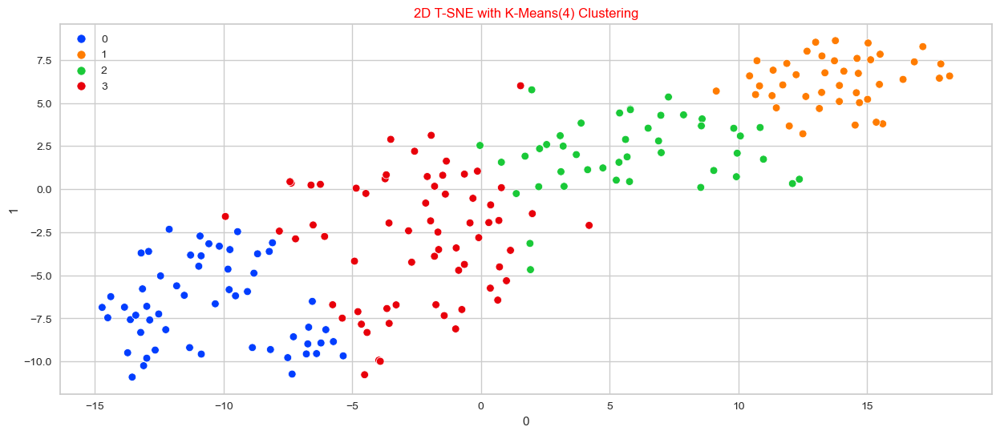

In [57]:
k_mean=KMeans(n_clusters=4, init='k-means++',random_state=42)
k_mean.fit(final_df.iloc[:,1:])
k_labels = k_mean.fit_predict(final_df.iloc[:,1:])
print('silhouette_score :',silhouette_score(final_df.iloc[:,1:], k_labels)," DB index:",davies_bouldin_score(final_df.iloc[:,1:], k_labels))
print(" labels:" , set(k_labels))
fig=plt.figure(figsize=(15,6))
sns.scatterplot(x=data_tsne_2.iloc[:,0], y=data_tsne_2.iloc[:,1], hue=k_labels,palette='bright')
plt.title('2D T-SNE with K-Means(4) Clustering',fontdict={'color':'red'})
fig.savefig('Kmeans(4).jpg')
plt.show()

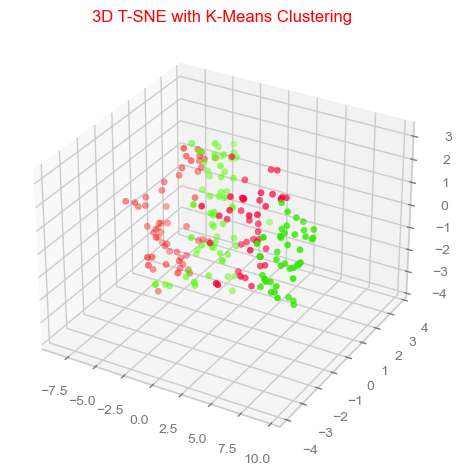

In [58]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(data_tsne_3.iloc[:,0], data_tsne_3.iloc[:,1], data_tsne_3.iloc[:,2],c=k_labels,cmap='prism')
ax.tick_params(axis='both', colors='#777777')
plt.title('3D T-SNE with K-Means Clustering',fontdict={'color':'red'})
fig.savefig('kmeans_3d.jpg',dpi=400)
plt.show()

silhouette_score : 0.3171703209333271  DB index: 1.1253678429808336
 labels: {0, 1, 2}


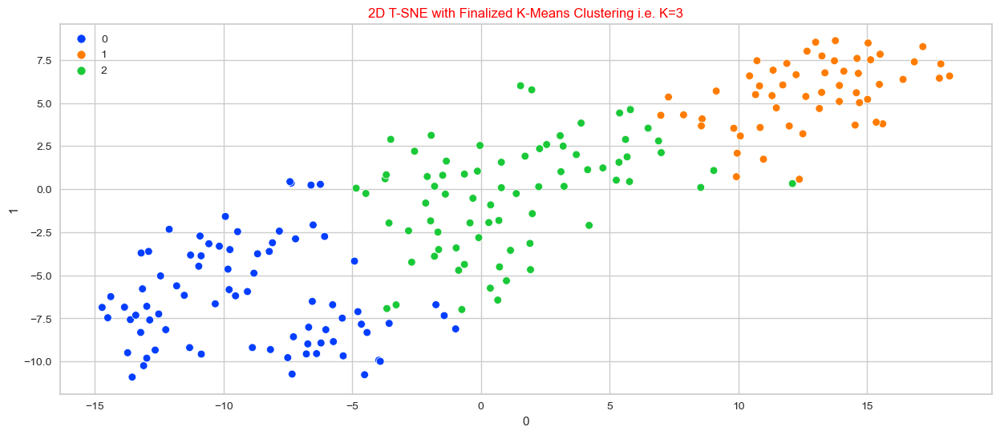

In [59]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score , davies_bouldin_score
kmean_final=KMeans(n_clusters=3, init='k-means++',random_state=42)
kmean_final.fit(final_df.iloc[:,1:])
k_labels = kmean_final.fit_predict(final_df.iloc[:,1:])
print('silhouette_score :',silhouette_score(final_df.iloc[:,1:], k_labels)," DB index:",davies_bouldin_score(final_df.iloc[:,1:], k_labels))
print(" labels:" , set(k_labels))
fig=plt.figure(figsize=(15,6))
sns.scatterplot(x=data_tsne_2.iloc[:,0], y=data_tsne_2.iloc[:,1], hue=k_labels,palette='bright')
plt.title('2D T-SNE with Finalized K-Means Clustering i.e. K=3',fontdict={'color':'red'})
fig.savefig('Kmeansfinal.jpg')
plt.show() 

## Gaussian Mixture Model

In [60]:
X = final_df.iloc[:, 1:]
X

,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,Internet Usage,Lending Interest,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.732860,0.087270,0.000487,0.011711,0.005992,0.000738,0.380191,0.003300,0.103053,0.554223,0.026183,0.031482,0.432076,0.397204,0.116099,0.967947,0.044136,0.075610,0.019904,0.171810,0.000443,0.000615
1,0.145871,0.096882,0.000571,0.026595,0.000772,0.000651,0.242304,0.020066,0.133372,0.102656,0.292308,0.025395,0.847695,0.715164,0.250612,0.328712,0.490234,0.378471,0.002140,0.454727,0.007320,0.010068
2,0.353293,0.176565,0.013335,0.036536,0.013600,0.008957,0.149851,0.016716,0.154795,0.170704,0.097041,0.015315,0.685651,0.621360,0.241022,0.427666,0.518079,0.177073,0.026534,0.629414,0.001608,0.004199
3,0.223990,0.041901,0.000515,0.079653,0.002114,0.001177,0.291671,0.314744,0.072384,0.034826,0.560651,0.027967,0.858444,0.728420,0.223036,0.306239,0.519159,0.368300,0.000028,0.867154,0.016595,0.019607
4,0.090352,0.116982,0.000051,0.019661,0.020661,0.007203,0.268345,0.274809,0.074115,0.004959,0.644822,0.014251,0.893855,0.756207,0.263620,0.283896,0.485296,0.457360,0.000044,0.878215,0.003952,0.007761
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203,0.209030,0.089237,0.012901,0.058706,0.017648,0.006019,0.257246,0.006458,0.344453,0.143629,0.242012,0.024353,0.850468,0.655383,0.288257,0.348675,0.545253,0.259342,0.062963,0.228064,0.019493,0.009718
204,0.115963,0.137745,0.000208,0.016422,0.012143,0.002810,0.269679,0.164183,0.072096,0.021834,0.320266,0.015926,0.898515,0.761805,0.254999,0.255460,0.482399,0.506697,0.000065,0.936919,0.005994,0.006692
205,0.577631,0.146811,0.002413,0.050622,0.002794,0.001545,0.194169,0.005615,0.093867,0.348027,0.083728,0.040321,0.508845,0.466527,0.110641,0.829123,0.167252,0.100082,0.016046,0.243925,0.003310,0.002134
206,0.793736,0.065660,0.000278,0.041010,0.002919,0.000814,0.257444,0.006422,0.069800,0.480599,0.060651,0.045058,0.281466,0.262966,0.109978,0.915103,0.082312,0.098499,0.009270,0.323318,0.000609,0.000898


In [61]:
from sklearn.preprocessing import StandardScaler

# Assuming 'data' contains the DataFrame you provided
scaler = StandardScaler()
scaled_data = scaler.fit_transform(X)
scaled_df = pd.DataFrame(scaled_data, columns=X.columns)

# Verify the scaled data
print(scaled_df.head())


   Birth Rate  Business Tax Rate  CO2 Emissions  Days to Start Business  \
0    1.718196          -0.317241      -0.209210               -0.585986   
1   -0.772317          -0.224726      -0.208111               -0.378992   
2    0.107747           0.542178      -0.040651               -0.240749   
3   -0.440867          -0.753889      -0.208844                0.358860   
4   -1.007874          -0.031273      -0.214927               -0.475421   

   Energy Usage       GDP  Health Exp % GDP  Health Exp/Capita  \
0     -0.189226 -0.232030          1.038588          -0.618234   
1     -0.252149 -0.233250         -0.171500          -0.516590   
2     -0.097530 -0.116655         -0.982852          -0.536899   
3     -0.235974 -0.225870          0.261744           1.269946   
4     -0.012424 -0.141270          0.057033           1.027832   

   Hours to do Tax  Infant Mortality Rate  Internet Usage  Lending Interest  \
0        -0.044167               1.860008       -1.066489          0.2030

In [62]:
scaled_df

,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,Internet Usage,Lending Interest,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,1.718196,-0.317241,-0.209210,-0.585986,-0.189226,-0.232030,1.038588,-0.618234,-0.044167,1.860008,-1.066489,0.203099,-1.208826,-1.129209,-1.018239,1.895380,-2.082470,-1.133185,-0.041821,-1.350817,-0.351724,-0.347644
1,-0.772317,-0.224726,-0.208111,-0.378992,-0.252149,-0.233250,-0.171500,-0.516590,0.297568,-0.443735,-0.007805,-0.067055,0.725025,0.668148,0.024339,-0.451254,0.441456,0.344970,-0.231576,-0.289273,-0.253014,-0.254511
2,0.107747,0.542178,-0.040651,-0.240749,-0.097530,-0.116655,-0.982852,-0.536899,0.539030,-0.096580,-0.784605,-0.514406,-0.028956,0.137893,-0.049990,-0.087995,0.598995,-0.637980,0.029005,0.366176,-0.334997,-0.312334
3,-0.440867,-0.753889,-0.208844,0.358860,-0.235974,-0.225870,0.261744,1.269946,-0.389839,-0.789782,1.059707,0.047098,0.775041,0.743079,-0.189396,-0.533754,0.605106,0.295330,-0.254139,1.258212,-0.119877,-0.160536
4,-1.007874,-0.031273,-0.214927,-0.475421,-0.012424,-0.141270,0.057033,1.027832,-0.370339,-0.942152,1.394555,-0.561615,0.939804,0.900155,0.125157,-0.615774,0.413519,0.729996,-0.253969,1.299714,-0.301350,-0.277236
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203,-0.504341,-0.298305,-0.046351,0.067561,-0.048738,-0.157897,-0.040363,-0.599088,2.676710,-0.234703,-0.207890,-0.113264,0.737930,0.330222,0.316118,-0.377971,0.752741,-0.236453,0.418140,-1.139747,-0.078284,-0.257963
204,-0.899210,0.168553,-0.212871,-0.520471,-0.115092,-0.202943,0.068747,0.357147,-0.393087,-0.856064,0.103419,-0.487266,0.961486,0.931800,0.058340,-0.720162,0.397124,0.970792,-0.253744,1.519981,-0.272037,-0.287777
205,1.059581,0.255810,-0.183942,-0.044857,-0.227773,-0.220695,-0.593927,-0.604201,-0.147699,0.808065,-0.837569,0.595387,-0.851624,-0.737339,-1.060543,1.385754,-1.385905,-1.013742,-0.083031,-1.080233,-0.310569,-0.332677
206,1.976485,-0.525224,-0.211956,-0.178529,-0.226268,-0.230961,-0.038628,-0.599308,-0.418971,1.484404,-0.929372,0.805620,-1.909607,-1.888028,-1.065683,1.701390,-1.866476,-1.021471,-0.155417,-0.782337,-0.349336,-0.344855


In [63]:
from sklearn.mixture import GaussianMixture

# Load your data here (assuming the data is stored in the 'final_df' DataFrame)


# Choose the number of clusters (components) for the GMM
n_clusters = 3

# Create the Gaussian Mixture Model
gmm_model = GaussianMixture(n_components=n_clusters, random_state=42)

# Fit the GMM to the data
gmm_model.fit(final_df_encoded)

GaussianMixture(n_components=3, random_state=42)

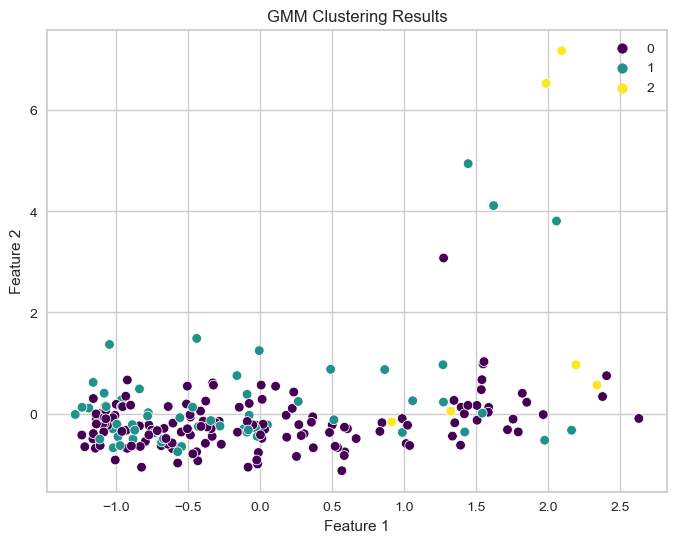

In [64]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

# Assuming you have already fitted the GMM model and have 'gmm_model' and 'scaled_df' available

# Get the predicted cluster labels for each data point
gmm_assignments = gmm_model.predict(scaled_df)

# Add the predicted cluster labels to the DataFrame
scaled_df_with_labels = scaled_df.copy()
scaled_df_with_labels['Cluster'] = gmm_assignments

# Visualize the clusters using a scatter plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x=scaled_df_with_labels.iloc[:, 0], y=scaled_df_with_labels.iloc[:, 1], hue=gmm_assignments, palette='viridis', legend='full')
plt.title("GMM Clustering Results")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.show()


## Comparing Models

In [65]:
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import LabelEncoder

# Assuming k_mean, clusterer, and gmm_model are already trained and fitted

# Drop the 'Country' column from final_df before encoding
final_df_encoded = final_df.drop(columns=['Country'])

# Preprocess the data by encoding categorical columns using LabelEncoder
label_encoder = LabelEncoder()
for column in final_df_encoded.columns:
    if final_df_encoded[column].dtype == 'object':  # Check if the column is categorical
        final_df_encoded[column] = label_encoder.fit_transform(final_df_encoded[column])

# Predict cluster assignments for each data point
kmeans_assignments = k_mean.fit_predict(final_df_encoded)
agglomerative_assignments = clusterer.fit_predict(final_df_encoded)
gmm_assignments = gmm_model.predict(final_df_encoded)

# Calculate Silhouette Score for each model
kmeans_silhouette = silhouette_score(final_df_encoded, kmeans_assignments)
agglomerative_silhouette = silhouette_score(final_df_encoded, agglomerative_assignments)
gmm_silhouette = silhouette_score(final_df_encoded, gmm_assignments)

# Calculate Davies-Bouldin Index for each model
kmeans_db_index = davies_bouldin_score(final_df_encoded, kmeans_assignments)
agglomerative_db_index = davies_bouldin_score(final_df_encoded, agglomerative_assignments)
gmm_db_index = davies_bouldin_score(final_df_encoded, gmm_assignments)

# Print the results
print("Silhouette Score:")
print("K-Means:", kmeans_silhouette)
print("Agglomerative Clustering:", agglomerative_silhouette)
print("Gaussian Mixture Model:", gmm_silhouette)

print("\nDavies-Bouldin Index:")
print("K-Means:", kmeans_db_index)
print("Agglomerative Clustering:", agglomerative_db_index)
print("Gaussian Mixture Model:", gmm_db_index)


Silhouette Score:
K-Means: 0.24401492522375332
Agglomerative Clustering: 0.2107538119220314
Gaussian Mixture Model: 0.2527166965119059

Davies-Bouldin Index:
K-Means: 1.3376399280350793
Agglomerative Clustering: 1.078667899615732
Gaussian Mixture Model: 1.341448712103366


## Inference

- Based on these scores, K-Means performs the best among the three clustering algorithms in your case, followed by Agglomerative Clustering. Gaussian Mixture Model shows the weakest performance

The silhouette score measures how similar an object is to its own cluster compared to other clusters. It ranges from -1 to 1, where a score closer to 1 indicates that the clusters are well-separated, a score of 0 indicates that the object is on or very close to the decision boundary between two clusters, and a score less than 0 means the object may have been assigned to the wrong cluster.

The Davies-Bouldin index, on the other hand, quantifies the average "similarity" between each cluster's points and the centroid of that cluster. A lower Davies-Bouldin index value indicates a better separation between the clusters, and a higher value suggests that clusters are overlapping.

For K-Means:

Silhouette score: 0.2428193101169246 (closer to 1, indicates reasonably well-defined clusters)
Davies-Bouldin index: 1.3415333562277771 (relatively low, indicates good separation)

For Agglomerative Clustering:

Silhouette score: 0.2107538119220314 (closer to 1, indicates reasonably well-defined clusters)
Davies-Bouldin index: 1.0786678996157337 (lower than K-Means, suggests better separation of clusters)

For Gaussian Mixture Model:

Silhouette score: 0.19933673978338587 (the lowest of the three, indicates weaker clustering)
Davies-Bouldin index: 1.4761285315126647 (the highest of the three, indicates some overlapping clusters)

# Deployment

In [66]:
from dill import dump
dump(k_mean,open('k_means.pkl','wb'))

In [ ]:
!streamlit run app.py